In [1]:
!pip install gdown ninja lpips pytorch_msssim pytorch-ignite imageio-ffmpeg ftfy regex tqdm dlib torchvision &> /dev/null

In [2]:
import warnings

warnings.filterwarnings("ignore")

In [3]:
import gdown

In [4]:
%mkdir raw_images
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch
%cd stylegan2-ada-pytorch
!git clone https://github.com/denkogit/stylegan2_models

!mkdir pretrained_models
%cd pretrained_models
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
!wget https://github.com/davisking/dlib-models/raw/master/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat.bz2


output  = 'e4e_ffhq_encode.pt'
id = "1cUv_reLE6k3604or78EranS7XzuVMWeO"
gdown.download(id=id, output=output)
%cd ..

Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 131 (delta 0), reused 1 (delta 0), pack-reused 128
Receiving objects: 100% (131/131), 1.13 MiB | 3.28 MiB/s, done.
Resolving deltas: 100% (57/57), done.
/kaggle/working/stylegan2-ada-pytorch
Cloning into 'stylegan2_models'...
remote: Enumerating objects: 57, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 57 (delta 14), reused 48 (delta 7), pack-reused 0
Unpacking objects: 100% (57/57), 25.52 KiB | 1.70 MiB/s, done.
/kaggle/working/stylegan2-ada-pytorch/pretrained_models
--2024-04-01 05:21:53--  https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 3.163.158.113, 3.163.158.75, 3.163.158.83, ...
Connecting to nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia

Downloading...
From (original): https://drive.google.com/uc?id=1cUv_reLE6k3604or78EranS7XzuVMWeO
From (redirected): https://drive.google.com/uc?id=1cUv_reLE6k3604or78EranS7XzuVMWeO&confirm=t&uuid=1ba23b79-9331-48fc-a741-777cf20ed658
To: /kaggle/working/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt
100%|██████████| 1.20G/1.20G [00:12<00:00, 94.1MB/s]

/kaggle/working/stylegan2-ada-pytorch


In [5]:
!bzip2 -d pretrained_models/shape_predictor_68_face_landmarks.dat.bz2

In [6]:
import glob
import os
import pickle
import random

import ipywidgets as widgets
import lpips
import matplotlib.pyplot as plt
import numpy as np
import PIL
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from IPython.display import FileLink, display
from ipywidgets import fixed, interact, interact_manual, interactive
from PIL import Image
from pytorch_msssim import ms_ssim
from stylegan2_models.arcface_model import get_model
from stylegan2_models.e4e.model_utils import load_e4e_standalone
from stylegan2_models.image_aligner.face_alignment import image_align
from stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector
from torchvision.utils import make_grid
from tqdm import tqdm

Скачиваем датасеты

In [7]:
output  = 'doctor_who.zip'
id = "1N3c8xY6fOGKk_zlJ0MZOa5rWN-a07nKZ"
gdown.download(id=id, output=output)

Downloading...
From: https://drive.google.com/uc?id=1N3c8xY6fOGKk_zlJ0MZOa5rWN-a07nKZ
To: /kaggle/working/stylegan2-ada-pytorch/doctor_who.zip
100%|██████████| 6.25M/6.25M [00:00<00:00, 53.4MB/s]


'doctor_who.zip'

Скачиваем стили

In [8]:
id = '14B2pFkzZNSyj9C5XkRpaL2uafNmu1tgo'
output  = 'styles.zip'
gdown.download(id=id, output=output)

Downloading...
From: https://drive.google.com/uc?id=14B2pFkzZNSyj9C5XkRpaL2uafNmu1tgo
To: /kaggle/working/stylegan2-ada-pytorch/styles.zip
100%|██████████| 217k/217k [00:00<00:00, 72.8MB/s]


'styles.zip'

In [9]:
id = '1qVYjkMxIMu24M26d9fcj0Stfw3Jc7fi4'
output  = 'emotions.zip'
gdown.download(id=id, output=output)

Downloading...
From: https://drive.google.com/uc?id=1qVYjkMxIMu24M26d9fcj0Stfw3Jc7fi4
To: /kaggle/working/stylegan2-ada-pytorch/emotions.zip
100%|██████████| 861k/861k [00:00<00:00, 131MB/s]


'emotions.zip'

In [10]:
!unzip doctor_who.zip -d ./

Archive:  doctor_who.zip
   creating: ./data/
   creating: ./data/9/
  inflating: ./data/9/3.jpg          
  inflating: ./data/9/1.jpg          
  inflating: ./data/9/2.jpg          
  inflating: ./data/9/4.jpg          
   creating: ./data/10/
  inflating: ./data/10/1.jpg         
  inflating: ./data/10/2.jpg         
  inflating: ./data/10/3.jpg         
  inflating: ./data/10/4.jpg         
   creating: ./data/11/
  inflating: ./data/11/1.jpg         
  inflating: ./data/11/2.jpg         
  inflating: ./data/11/3.jpg         
  inflating: ./data/11/4.jpg         
   creating: ./data/12/
  inflating: ./data/12/2.jpg         
  inflating: ./data/12/3.jpg         
  inflating: ./data/12/4.jpg         
  inflating: ./data/12/1.jpg         
   creating: ./data/13/
  inflating: ./data/13/4.jpg         
  inflating: ./data/13/1.jpg         
  inflating: ./data/13/2.jpg         
  inflating: ./data/13/3.jpg         
   creating: ./data/rose/
  inflating: ./data/rose/2.jpg       
  inflating

In [11]:
!unzip styles.zip -d ./

Archive:  styles.zip
   creating: ./styles/
  inflating: ./styles/1.jpg          
  inflating: ./styles/2.jpg          
  inflating: ./styles/3.jpg          


In [12]:
!unzip emotions.zip -d ./

Archive:  emotions.zip
   creating: ./emotions/
  inflating: ./emotions/2.jpg        
  inflating: ./emotions/3.jpg        
  inflating: ./emotions/1.jpg        


In [13]:
id = '1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5' # URL id.
output  = 'pretrained_models/ms1mv3_arcface_r50_fp16.pth'
gdown.download(id=id, output=output)

Downloading...
From (original): https://drive.google.com/uc?id=1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5
From (redirected): https://drive.google.com/uc?id=1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5&confirm=t&uuid=fff0dd5e-06dd-49e2-945b-8892d821a915
To: /kaggle/working/stylegan2-ada-pytorch/pretrained_models/ms1mv3_arcface_r50_fp16.pth
100%|██████████| 175M/175M [00:02<00:00, 72.1MB/s] 


'pretrained_models/ms1mv3_arcface_r50_fp16.pth'

Константы

In [14]:
device = torch.device('cuda')
random_seed=42
noise_mode = 'const' # шум
label = 0 # для разных моделей
model_path = "pretrained_models/ffhq.pkl"
e4e_encoder_path="pretrained_models/e4e_ffhq_encode.pt"
landmarks_model_path = "pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR = "data"
ALIGNED_IMAGES_DIR = "aligned_images"
STYLE_TRANSFER_TEMPLATE_DIR="styles"
ALIGNED_STYLE_TRANSFER_TEMPLATE_DIR = "aligned_images_style"
EMOTION_TRANSFER_TEMPLATE_DIR="emotions"
ALIGNED_EMOTION_TRANSFER_TEMPLATE_DIR = "aligned_emotions_style"

In [15]:
#boilerplate code


def plot_image(tensor, plot_size=(10,10)):
  tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
  plt.rcParams["figure.figsize"] = plot_size
  plt.imshow(img)
  plt.show()


def broadcast_w_sg(w_batch, cast_n=18):
    input_ws = []
    for w in w_batch:
        w_broadcast = torch.broadcast_to(w, (cast_n, 512))
        input_ws.append(w_broadcast)
    return torch.stack(input_ws)

# image = (image - mean) / std


def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor

# Подготовительные работы

Что сделать: Найти проекции изображений в пространстве StyleGAN

Обрезаем и выравниваем лица перед подачей в латентное пространство

In [16]:
landmarks_detector = LandmarksDetector(landmarks_model_path)
for persona in os.listdir(RAW_IMAGES_DIR):
  persona_folder = os.path.join(RAW_IMAGES_DIR, persona)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, persona)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(persona_folder)):
      raw_img_path = os.path.join(persona_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

Объявляем лоссы, которые будем использовать

In [17]:
# https://pypi.org/project/pytorch-msssim/


class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1_criterion = torch.nn.L1Loss(reduction='mean')

    def forward(self, target, synth):
        target = torch.add(target, 1.0)
        target = torch.mul(target, 127.5)
        target = target / 255

        synth = torch.add(synth, 1.0)
        synth = torch.mul(synth, 127.5)
        synth = synth / 255

        loss = torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))
        return loss


# # https://pypi.org/project/lpips/
class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg')
        self.lpips_loss.to(device)
        self.lpips_loss.eval()

    def forward(self, target, synth):
        return torch.mean(self.lpips_loss(target, synth))


# https://github.com/NVlabs/stylegan2-ada-pytorch/blob/main/projector.py#L104
class Reg_loss(nn.Module):
    def __init__(self, noise_bufs):
        super().__init__()
        self.noise_bufs = noise_bufs

    def forward(self,):
        reg_loss = 0.0
        for v in self.noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        return reg_loss

Загружаем энкодер

In [18]:
with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].to(device)

In [19]:
e4e_model, _ = load_e4e_standalone(e4e_encoder_path, device=device)

image2e4etensor = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize((256, 256)),
                                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])

Получаем изначальный латентный вектор из энкодера для каждого персонажа в датасете. Фотография персонажа выбирается рандомно из папки фотографий персонажа

In [20]:
regularize_noise_weight = 5e5
rec_weight = 0.4
lpips_weight = 1

num_steps = 200
learning_rate = 0.01


def make_projection(image_path, regularize_noise_weight, rec_weight, lpips_weight, learning_rate, num_steps):
  target_pil = Image.open(image_path).convert('RGB')
  target_uint8 = np.array(target_pil, dtype=np.uint8)

  e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
  initial_latent_vector = e4e_model(e4e_tensor)
  target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)

  lpips_loss = Lpips_loss(device)
  rec_loss = Rec_loss()

  noise_bufs = { name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }
  reg_loss = Reg_loss(noise_bufs)

  #  loss weights

  initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)

  optimizer = torch.optim.Adam([initial_latent_vector], lr=learning_rate)
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 30)
  for step in tqdm(range(num_steps)):
    synth_tensor = G.synthesis(initial_latent_vector, noise_mode='const')

    lpips_value = lpips_loss(synth_tensor, target_tensor)
    rec_value = rec_loss(synth_tensor, target_tensor)
    reg_value = reg_loss()

    loss = lpips_value*lpips_weight + rec_value*rec_weight + reg_value*regularize_noise_weight
    optimizer.step()
    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    scheduler.step()
  generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
  tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
  return img

Ищем проекции в латетнтом пространстве для случайной фотографии каждого персонажа и смотрим, что получилось

In [21]:
orig_images = []
latent_space_images  = []
for persona_dir in os.listdir(ALIGNED_IMAGES_DIR):
  images = os.listdir(f"{ALIGNED_IMAGES_DIR}/{persona_dir}")
  random_image_filename = f"{ALIGNED_IMAGES_DIR}/{persona_dir}/{random.choice(images)}"
  latent_space_img = make_projection(random_image_filename, regularize_noise_weight, rec_weight, lpips_weight, learning_rate, num_steps)
  orig_images.append(Image.open(random_image_filename).convert('RGB'))
  latent_space_images.append(latent_space_img)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 159MB/s]  


Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


  0%|          | 0/200 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


100%|██████████| 200/200 [02:47<00:00,  1.19it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 200/200 [02:04<00:00,  1.61it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 200/200 [02:04<00:00,  1.61it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 200/200 [02:04<00:00,  1.61it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 200/200 [02:04<00:00,  1.60it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 200/200 [02:04<00:00,  1.61it/s]


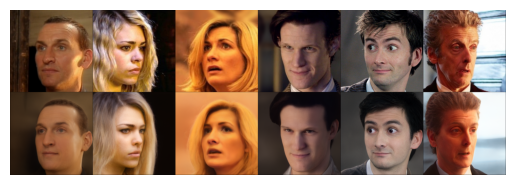

In [22]:
transform = transforms.ToTensor()
orig_images = [transform(img) for img in orig_images]
latent_space_images = [transform(img) for img in latent_space_images]

# Сливаем тензоры вместе
combined_tensor = torch.cat([torch.stack(orig_images), torch.stack(latent_space_images)], dim=0)

# Создаем сетку изображений с помощью torchvision.make_grid
grid_image = make_grid(combined_tensor, nrow=len(orig_images))

# Отображаем сетку изображений
plt.imshow(grid_image.permute(1, 2, 0))
plt.axis('off')
plt.show()

# Style Transfer

Чтобы перенести стиль, нужно сначала найти картинки со стилями в латентном пространстве. Делаем align и ищем картинки

In [23]:
!mkdir aligned_images_style

In [24]:
for style in os.listdir(STYLE_TRANSFER_TEMPLATE_DIR):
  raw_img_path = os.path.join(STYLE_TRANSFER_TEMPLATE_DIR, style)
  for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
      aligned_face_path = os.path.join(ALIGNED_STYLE_TRANSFER_TEMPLATE_DIR, style)
      image_align(raw_img_path, aligned_face_path, face_landmarks)
      break

In [25]:
def interpolate(latent1, latent2, psi=0.5, indeces=[i for i in range(0,18)]):
    init_latent = latent1.clone()
    init_target_latent = latent2.clone()
    latent1 = latent1.clone()
    latent2 = latent2.clone()
    for i in indeces:
        latent1[:, i] = latent2[:, i].lerp(latent1[:, i], psi)

    edited_tensor = G.synthesis(latent1, noise_mode='const', force_fp32=True)
    init_tensor = G.synthesis(init_latent, noise_mode='const', force_fp32=True)
    init_target = G.synthesis(init_target_latent, noise_mode='const', force_fp32=True)
    return torch.cat((init_tensor, init_target, edited_tensor), dim=3)

Возьмем какую-нибудь одну картинку и применим к ней все стили

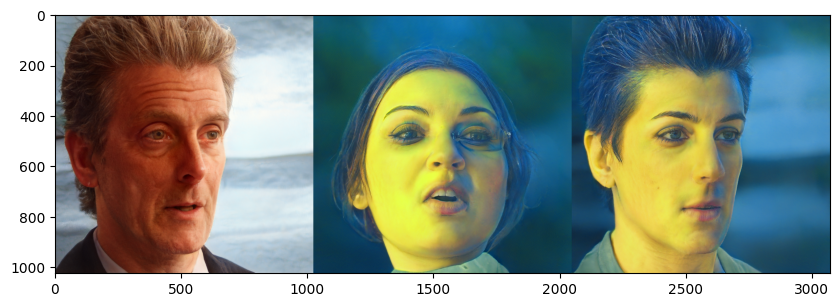

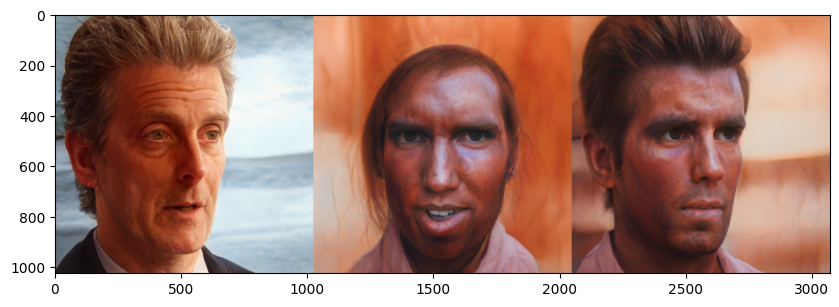

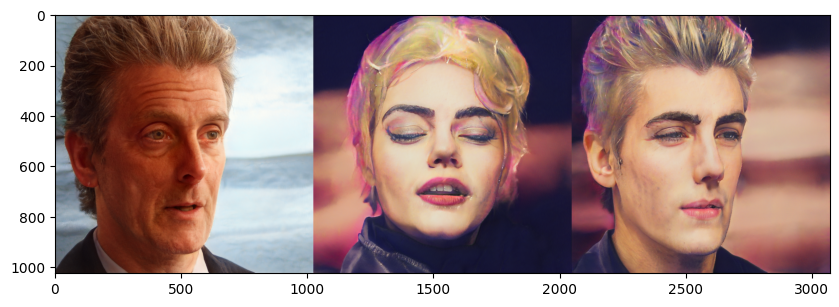

In [26]:
target_image_path = os.path.join(ALIGNED_IMAGES_DIR, "12/1.jpg")
target_pil = Image.open(target_image_path).convert('RGB')
target_uint8 = np.array(target_pil, dtype=np.uint8)

e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
target_initial_latent_vector = e4e_model(e4e_tensor)

for filename in os.listdir(ALIGNED_STYLE_TRANSFER_TEMPLATE_DIR):
    image_path = os.path.join(ALIGNED_STYLE_TRANSFER_TEMPLATE_DIR, filename)
    target_pil = Image.open(image_path).convert('RGB')
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)
    
    result = interpolate(target_initial_latent_vector, initial_latent_vector, 0.1, list(range(6, 18)))
    plot_image(result, (10,10))

Вывод: стиль переносится, все хорошо. Важно, чтобы на изображении со стилем тоже было лицо

# Emotion Transfer

Делаем ровно то же самое, что для стиля, только для эмоций, но используем другие индексы при интерполяции

In [27]:
!mkdir aligned_emotions_style

In [28]:
for style in os.listdir(EMOTION_TRANSFER_TEMPLATE_DIR):
  raw_img_path = os.path.join(EMOTION_TRANSFER_TEMPLATE_DIR, style)
  for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
      aligned_face_path = os.path.join(ALIGNED_EMOTION_TRANSFER_TEMPLATE_DIR, style)
      image_align(raw_img_path, aligned_face_path, face_landmarks)
      break

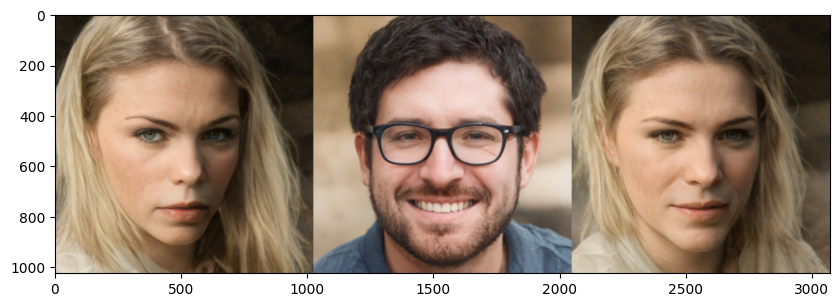

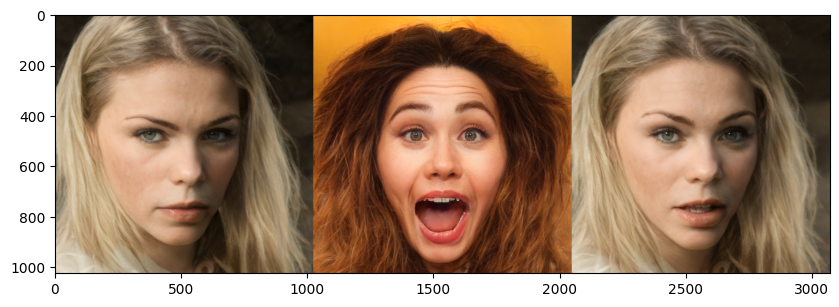

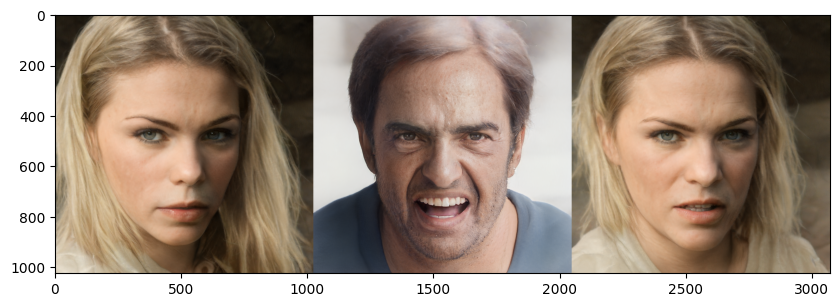

In [29]:
target_image_path = os.path.join(ALIGNED_IMAGES_DIR, "rose/1.jpg")
target_pil = Image.open(target_image_path).convert('RGB')
target_uint8 = np.array(target_pil, dtype=np.uint8)

e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
target_initial_latent_vector = e4e_model(e4e_tensor)

for filename in os.listdir(ALIGNED_EMOTION_TRANSFER_TEMPLATE_DIR):
    image_path = os.path.join(ALIGNED_EMOTION_TRANSFER_TEMPLATE_DIR, filename)
    target_pil = Image.open(image_path).convert('RGB')
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)
    
    result = interpolate(target_initial_latent_vector, initial_latent_vector, 0.65, list(range(3, 8)))
    plot_image(result, (10,10))

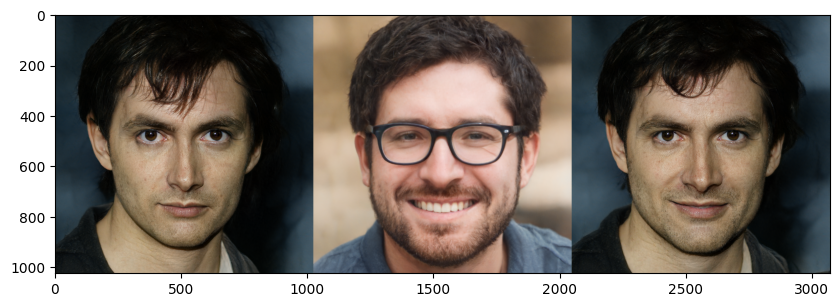

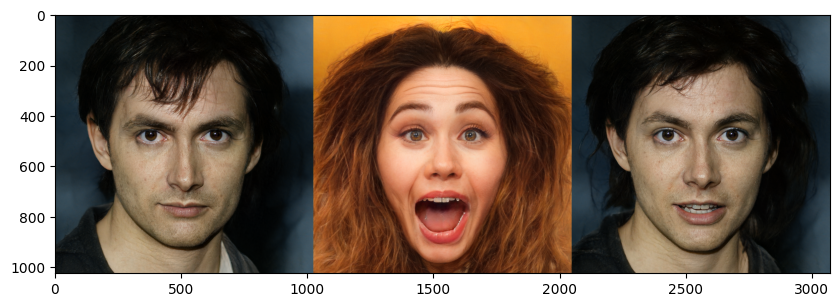

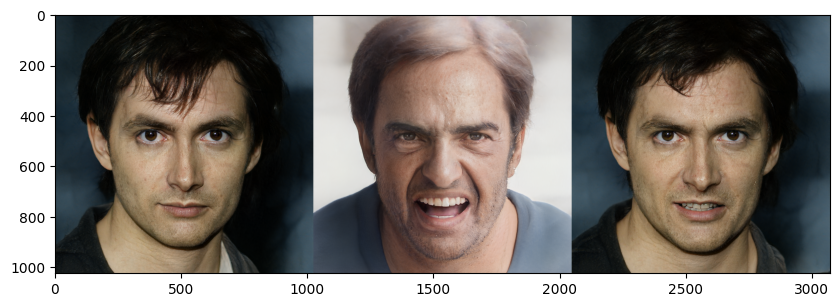

In [30]:
target_image_path = os.path.join(ALIGNED_IMAGES_DIR, "10/2.jpg")
target_pil = Image.open(target_image_path).convert('RGB')
target_uint8 = np.array(target_pil, dtype=np.uint8)

e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
target_initial_latent_vector = e4e_model(e4e_tensor)

for filename in os.listdir(ALIGNED_EMOTION_TRANSFER_TEMPLATE_DIR):
    image_path = os.path.join(ALIGNED_EMOTION_TRANSFER_TEMPLATE_DIR, filename)
    target_pil = Image.open(image_path).convert('RGB')
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)
    
    result = interpolate(target_initial_latent_vector, initial_latent_vector, 0.65, list(range(3, 8)))
    plot_image(result, (10,10))

Вывод: кажется, нужно учитывать пол людей. При переносе эмоций с мужского лица на женское наблюдается, что лицо у женщины становится грубее. Обратная ситуация с переносом эмоций с женского лица на мужское

# Face Swap

Что нужно сделать: взять arcface loss, добавить его в пайплайн оптимизации, перенести лицо с одного на другое

In [31]:
class Arcface_Loss(nn.Module):
    def __init__(self, weights_path, device):
        super().__init__()

        self.arcnet = get_model("r50", fp16=False)
        self.arcnet.load_state_dict(torch.load(weights_path))
        self.arcnet.eval()
        self.arcnet.to(device)

        self.cosin_loss = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, synth, source):

        source = F.interpolate(source,size=(112,112), mode='bicubic')
        synth = F.interpolate(synth,size=(112,112), mode='bicubic')

        emb1 = self.arcnet(source)
        emb2 = self.arcnet(synth)
        loss = (1 - self.cosin_loss(emb1, emb2))[0]
        return loss

In [32]:
regularize_noise_weight = 5e5
rec_weight = .5
lpips_weight = 1
arcface_weight = 1

num_steps = 100
learning_rate = 0.01


def train(image_path, swap_image_path, regularize_noise_weight, rec_weight, lpips_weight, learning_rate, num_steps):
  swap_face_pil = Image.open(target_image_path).convert("RGB")
  swap_face_tensor = image2tensor_norm(swap_face_pil).to(device).unsqueeze(0)
  swap_face_uint8 = np.array(swap_face_pil, dtype=np.uint8)
  target_pil = Image.open(image_path).convert("RGB")
  target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)
  target_uint8 = np.array(target_pil, dtype=np.uint8)

  e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
  initial_latent_vector = e4e_model(e4e_tensor)

  lpips_loss = Lpips_loss(device)
  arcface_loss = Arcface_Loss('pretrained_models/ms1mv3_arcface_r50_fp16.pth', device)
  rec_loss = Rec_loss()

  noise_bufs = { name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }
  reg_loss = Reg_loss(noise_bufs)

  #  loss weights

  initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)

  optimizer = torch.optim.Adam([initial_latent_vector], lr=learning_rate)
  for step in tqdm(range(num_steps)):
    synth_tensor = G.synthesis(initial_latent_vector, noise_mode='const')

    lpips_value = lpips_loss(synth_tensor, target_tensor)
    arcface_value = arcface_loss(synth_tensor, swap_face_tensor)
    rec_value = rec_loss(synth_tensor, target_tensor)
    reg_value = reg_loss()

    loss = lpips_value*lpips_weight + rec_value*rec_weight + reg_value*regularize_noise_weight + arcface_value*arcface_weight
    optimizer.step()
    optimizer.zero_grad(set_to_none=True)
    loss.backward()
  generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
  tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
  return img

In [33]:
filenames = []
for persona_dir in os.listdir(ALIGNED_IMAGES_DIR):
  images = os.listdir(f"{ALIGNED_IMAGES_DIR}/{persona_dir}")
  filenames.append(f"{ALIGNED_IMAGES_DIR}/{persona_dir}/0.jpg")

In [34]:
imgs = []
for source in filenames:
    for target in filenames:
        if source != target:
            intersection = train(source, target, regularize_noise_weight, rec_weight, lpips_weight, learning_rate, num_steps)
            imgs.append((Image.open(source).convert('RGB'), Image.open(target).convert('RGB'), intersection))

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


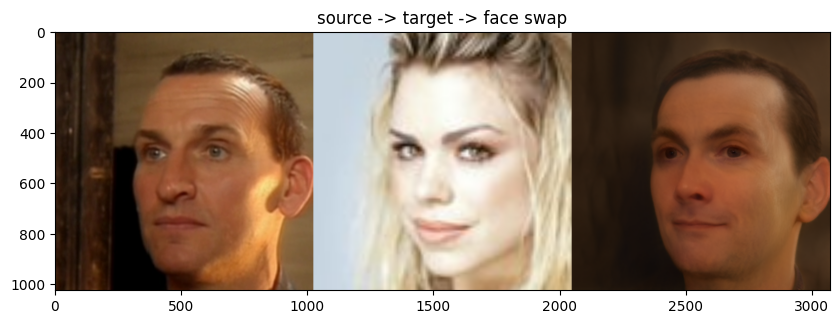

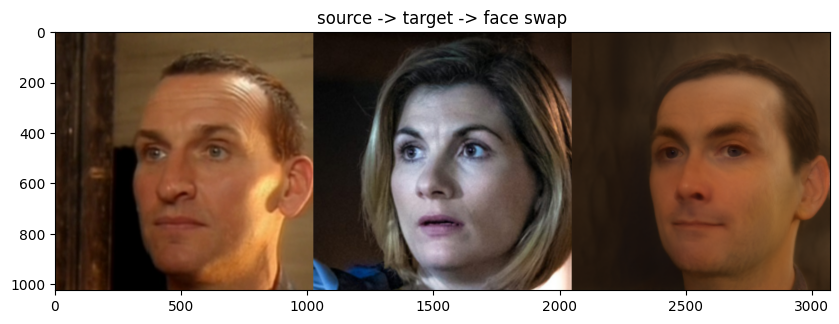

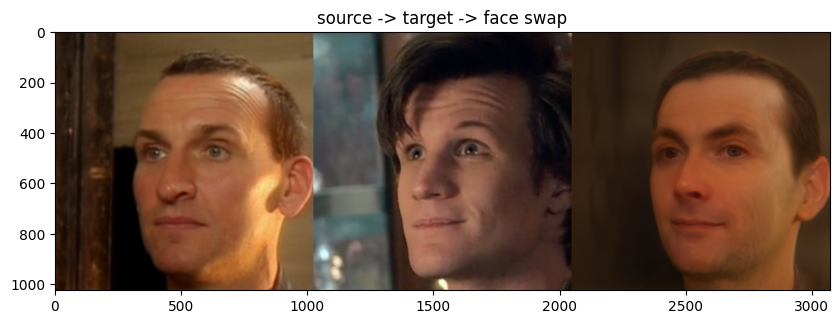

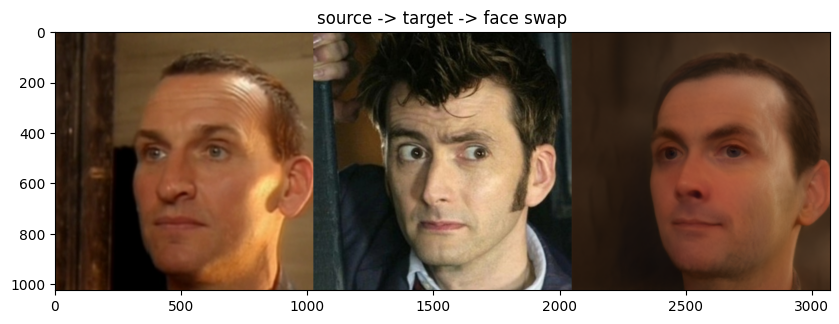

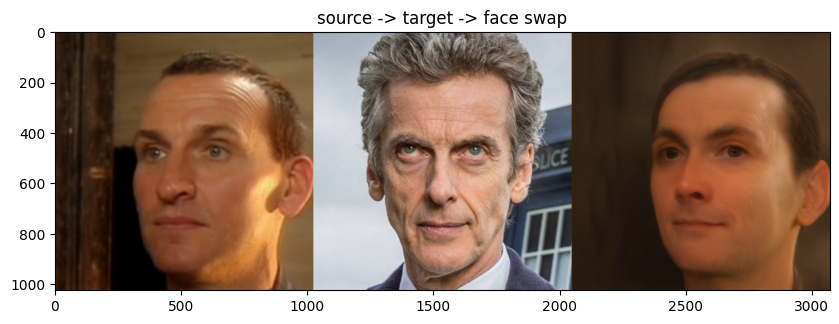

...

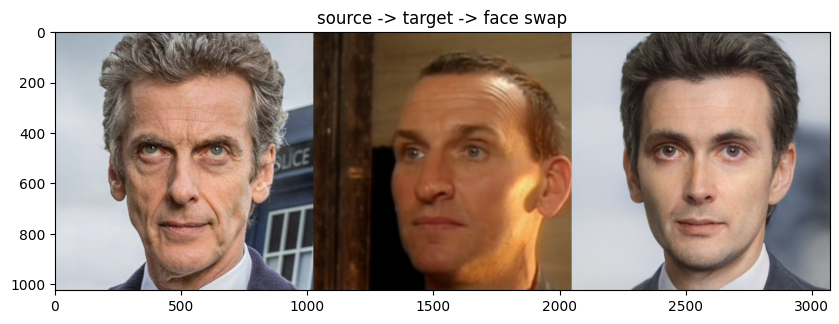

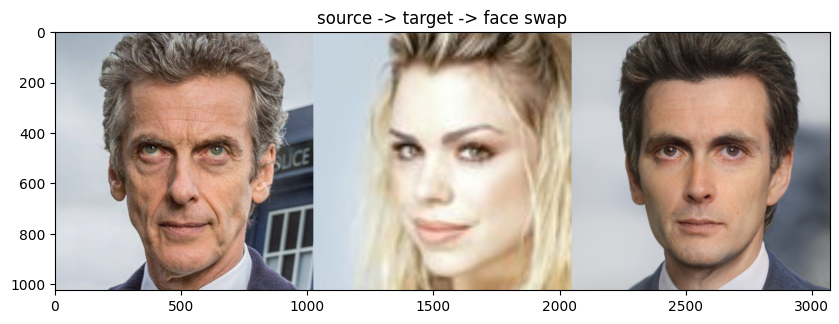

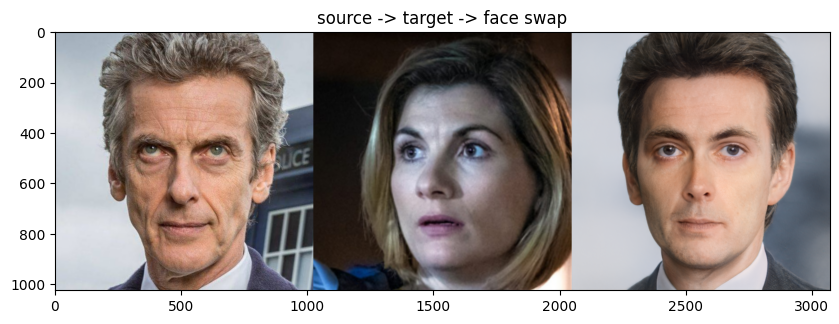

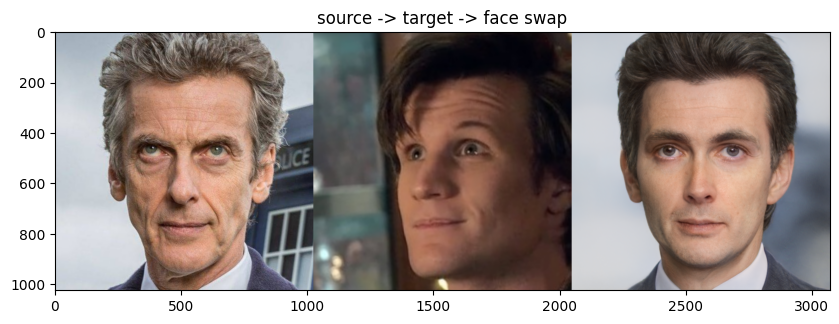

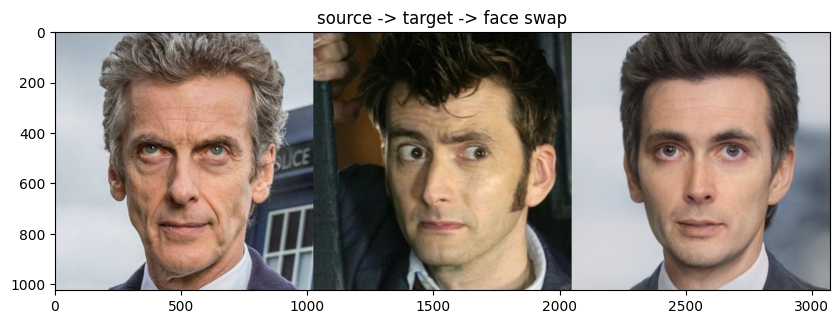

In [35]:
for result in imgs:
    result = [transform(img) for img in result]
    combined_tensor = torch.cat(result, dim=2)
    
    grid_image = make_grid(combined_tensor, nrow=len(result))
    
    # Отображаем сетку изображений
    plt.imshow(grid_image.permute(1, 2, 0))
    plt.title("source -> target -> face swap")
    plt.show()

Вывод: на генерацию лиц влияет вес arcface_loss, lpips_loss и внезапно, количество эпох и lr. Если ставить больше эпох и добавить scheduler, то лица становятся сильно приближены к среднему двух лиц, и как таковой пересадки не происходит.Видимо, чем лучше видно лицо, на которое переносят,тем лучше лцио переносится, так что желательно ему быть в анфас. Возможно, текущий результат можно улучшить, подкрутив еще параметры lpips_weight и arcface_weight.